<a href="https://colab.research.google.com/github/rammalali/yolov5_objectDetection/blob/main/final1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# !rm -r /content/sample_dataset 
!unzip -q '/content/drive/MyDrive/Inmind_finalWeek/sample_dataset-20230414T152400Z-001.zip' -d '/content/sample_dataset'

In [3]:
!mkdir /content/sample_dataset/sample_dataset/images_aug

## Imports

In [4]:
import cv2
import os
import json
import shutil
import random
import numpy as np
import pandas as pd

# matplotlib for visualization
import matplotlib.pyplot as plt
from matplotlib import pyplot
import matplotlib.image as mpimg
import matplotlib.patches as patches


# for data split
from sklearn.model_selection import train_test_split

# for image augmentations
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from imgaug import augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage



# for ignoring warnings
import warnings
warnings.filterwarnings('ignore')

# xml library for parsing xml files
from xml.etree import ElementTree as et

# torchvision libraries
import torch
import torchvision
from torchvision import transforms as torchtrans  
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor





In [8]:
img = cv2.imread('/content/sample_dataset/sample_dataset/images/training_images_take_7_279.png')

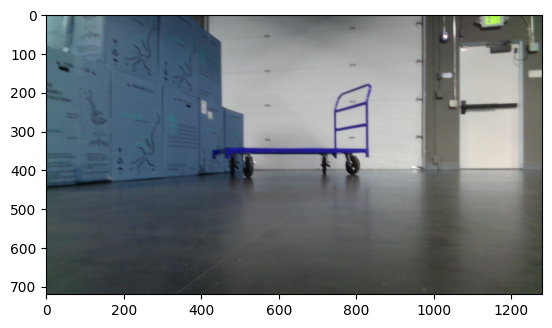

In [10]:
plt.imshow(img)

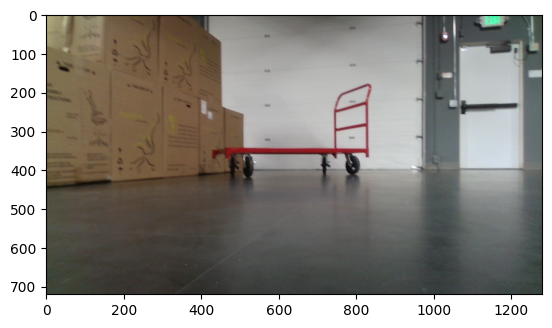

In [11]:
# Convert the image from BGR to RGB format
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

In [12]:
directory = '/content/sample_dataset/sample_dataset/images/'
file_list = os.listdir(directory)

In [13]:
len(file_list)

200

In [14]:
def extract_coordinates(json_string):

  data = json_string

  coordinates = []
  for obj in data:
    if "ObjectClassName" in obj and "Left" in obj and "Top" in obj and "Right" in obj and "Bottom" in obj:
      objectClassName = obj["ObjectClassName"]
      left = obj["Left"]
      top = obj["Top"]
      right = obj["Right"]
      bottom = obj["Bottom"]
      coordinates.append({"ObjectClassName": objectClassName, "Left": left, "Top": top, "Right": right, "Bottom": bottom})

  return coordinates


In [15]:
json_path = r'/content/sample_dataset/sample_dataset/labels/json/training_images_take_7_279.json'
with open(json_path, 'rb') as f:
  json_string = json.load(f)

In [16]:
coord = extract_coordinates(json_string)
coord

[{'ObjectClassName': 'Wheel',
  'Left': 505,
  'Top': 363,
  'Right': 544,
  'Bottom': 422},
 {'ObjectClassName': 'Wheel',
  'Left': 470,
  'Top': 366,
  'Right': 500,
  'Bottom': 418},
 {'ObjectClassName': 'Wheel',
  'Left': 707,
  'Top': 366,
  'Right': 735,
  'Bottom': 414},
 {'ObjectClassName': 'Wheel',
  'Left': 770,
  'Top': 361,
  'Right': 813,
  'Bottom': 415},
 {'ObjectClassName': 'Dolly',
  'Left': 420,
  'Top': 172,
  'Right': 848,
  'Bottom': 428}]

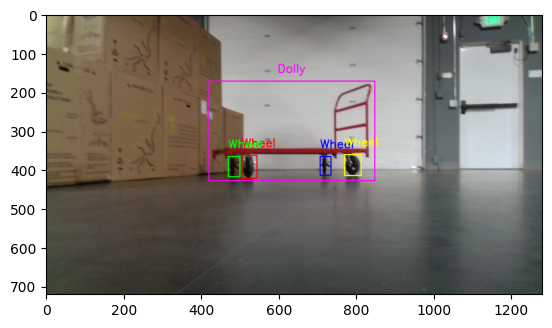

In [17]:
img = cv2.imread('/content/sample_dataset/sample_dataset/images/training_images_take_7_279.png')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255)]

font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_thickness = 2

# drow rectangles 
for i, bbox in enumerate(coord):
  color = colors[i % len(colors)]
  left, top, right, bottom = bbox['Left'], bbox['Top'], bbox['Right'], bbox['Bottom']
  objectClassName = bbox['ObjectClassName']
  cv2.rectangle(img_rgb, (left, top), (right, bottom), color, thickness=2)
  (text_width, text_height), _ = cv2.getTextSize(objectClassName, font, font_scale, font_thickness)
  text_left = max(left, left + (right - left) // 2 - text_width // 2)
  cv2.putText(img_rgb, objectClassName, (text_left, top - text_height), font, font_scale, color, font_thickness)

plt.imshow(img_rgb)
plt.show()

In [18]:
def get_label_path(image_path, format='json'):
  base_path = os.path.dirname(os.path.dirname(image_path))
  image_filename = os.path.basename(image_path)
  image_name, _ = os.path.splitext(image_filename)
  label_filename = f"{image_name}.{format}"
  label_path = os.path.join(base_path, "labels", format, label_filename)
  return label_path

image_path = "sample_dataset/sample_dataset/images/training_images_take_7_279.png"
label_path = get_label_path(image_path)
print(label_path)

sample_dataset/sample_dataset/labels/json/training_images_take_7_279.json


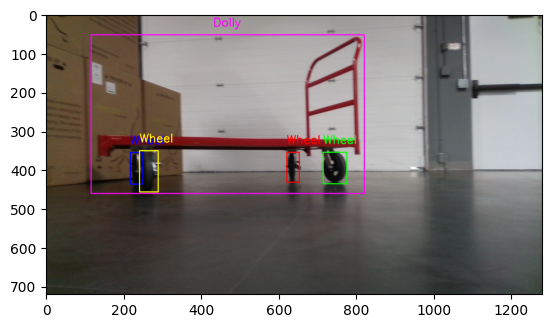

In [19]:
# summarizing all the results in one function:
def plot_labels(image_path):

  json_path = get_label_path(image_path)

  with open(json_path, 'rb') as f:
    json_string = json.load(f)

  coord = extract_coordinates(json_string)
  img = cv2.imread(image_path)

  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255)]

  font = cv2.FONT_HERSHEY_SIMPLEX
  font_scale = 1
  font_thickness = 2

  # drow rectangles 
  for i, bbox in enumerate(coord):
    color = colors[i % len(colors)]
    left, top, right, bottom = bbox['Left'], bbox['Top'], bbox['Right'], bbox['Bottom']
    objectClassName = bbox['ObjectClassName']
    cv2.rectangle(img_rgb, (left, top), (right, bottom), color, thickness=2)
    (text_width, text_height), _ = cv2.getTextSize(objectClassName, font, font_scale, font_thickness)
    text_left = max(left, left + (right - left) // 2 - text_width // 2)
    cv2.putText(img_rgb, objectClassName, (text_left, top - text_height), font, font_scale, color, font_thickness)

  plt.imshow(img_rgb)
  plt.show()

plot_labels('/content/sample_dataset/sample_dataset/images/training_images_take_7_358.png')

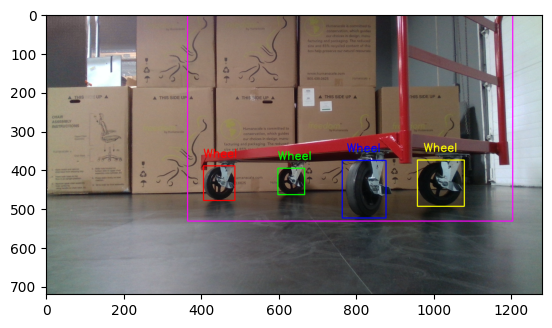

In [20]:
plot_labels('/content/sample_dataset/sample_dataset/images/training_images_take_7_484.png')

In [21]:
class LabelImage:
  def __init__(self, img_path):
    self.img_path = img_path


  def extract_coordinates(self, data):
    coordinates = []
    for obj in data:
      if "ObjectClassName" in obj and "Left" in obj and "Top" in obj and "Right" in obj and "Bottom" in obj:
        objectClassName = obj["ObjectClassName"]
        left = obj["Left"]
        top = obj["Top"]
        right = obj["Right"]
        bottom = obj["Bottom"]
        coordinates.append({"ObjectClassName": objectClassName, "Left": left, "Top": top, "Right": right, "Bottom": bottom})
    return coordinates  


  def get_label_path(self):
    base_path = os.path.dirname(os.path.dirname(self.img_path))
    image_filename = os.path.basename(self.img_path)
    image_name, _ = os.path.splitext(image_filename)
    label_filename = f"{image_name}.json"
    label_path = os.path.join(base_path, "labels", "json", label_filename)
    return label_path


  def plot_labels(self):
    json_path = self.get_label_path()
    with open(json_path, 'rb') as f:
      json_string = json.load(f)

    coord = self.extract_coordinates(json_string)
    img = cv2.imread(self.img_path)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255)]
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1
    font_thickness = 2

    # drow rectangles 
    for i, bbox in enumerate(coord):
      color = colors[i % len(colors)]
      left, top, right, bottom = bbox['Left'], bbox['Top'], bbox['Right'], bbox['Bottom']
      objectClassName = bbox['ObjectClassName']
      cv2.rectangle(img_rgb, (left, top), (right, bottom), color, thickness=2)
      (text_width, text_height), _ = cv2.getTextSize(objectClassName, font, font_scale, font_thickness)
      text_left = max(left, left + (right - left) // 2 - text_width // 2)
      cv2.putText(img_rgb, objectClassName, (text_left, top - text_height), font, font_scale, color, font_thickness)

    plt.imshow(img_rgb)
    plt.show()

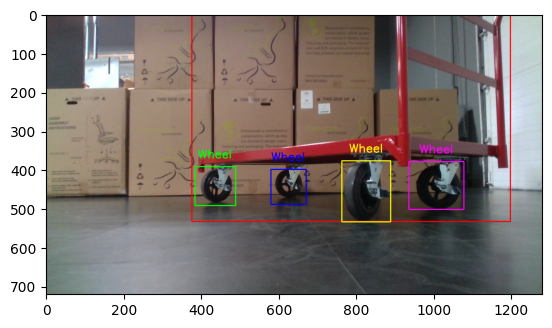

In [22]:
label_image1 = LabelImage('/content/sample_dataset/sample_dataset/images/training_images_take_7_485.png')
label_image1.plot_labels()

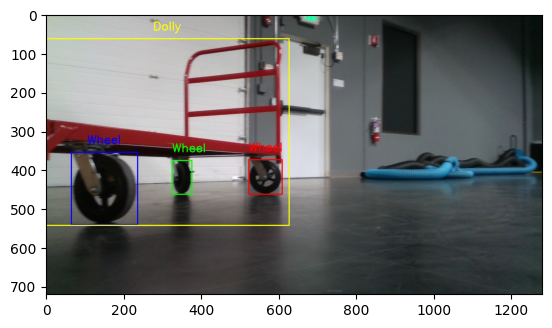

In [23]:
label_image2 = LabelImage('/content/sample_dataset/sample_dataset/images/training_images_take_7_420.png')
label_image2.plot_labels()

## data augmentation

In [24]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator
rotationRange=20
widthShiftRange = 0.1
heightShiftRange = 0.1
zoomRange = [0.2, 1.5]
datagen = ImageDataGenerator(
    rotation_range=rotationRange,
    width_shift_range=widthShiftRange,
    height_shift_range=heightShiftRange,
    zoom_range=zoomRange,
    horizontal_flip=True
)


In [25]:
def show_examples(it):

  pyplot.figure(figsize=(15,10))

  for i in range(9):
    pyplot.subplot(330 + 1 + i)
    batch = it.next()
    image = batch[0].astype('uint32')
    pyplot.imshow(image)
  pyplot.show()

training_images_take_7_460.png


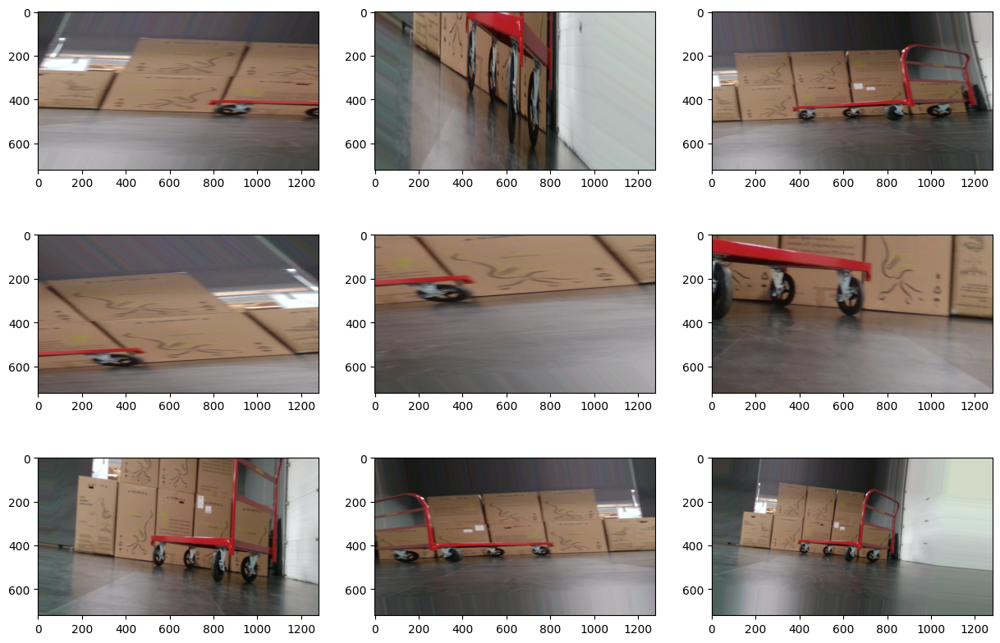

In [26]:
input_dir = r'/content/sample_dataset/sample_dataset/images'
output_dir = r'/content/sample_dataset/sample_dataset/generated/images'

list_images = os.listdir(input_dir)
img = load_img(os.path.join(input_dir, list_images[0]))
print(list_images[0])
x = img_to_array(img)
x = x.reshape((1,) + x.shape)

# datagen.flow(x, batch_size=1, save_to_dir=output_dir, save_prefix=list_images[0][:-4], save_format='png')
it = datagen.flow(x, batch_size=1)
show_examples(it)

In [27]:
print(get_label_path(os.path.join(input_dir, list_images[0])))

/content/sample_dataset/sample_dataset/labels/json/training_images_take_7_460.json


#### So doing data augmentation with keras is good for object detection and image classification, but for object multi-classification its really hard to augmente images and augmente the corresponding label at the same time.

#### so i will try to use imgaug library 
#### you can check the tutorial here: https://imgaug.readthedocs.io/en/latest/source/examples_bounding_boxes.html

In [28]:
def image_augmentation(images_path_dir, image_destination_path, json_destination_path, iteration = 1):
  for filename in os.listdir(images_path_dir):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
      # Load the image
      image_path = os.path.join(images_path_dir, filename)
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


      # Load the JSON data
      label_path = get_label_path(image_path)
      with open(label_path, "rb") as f:
        data = json.load(f)


      # Extract bounding boxes from JSON data
      bboxes = []
      for item in data:
        if item["ObjectClassName"] == "Wheel" or item["ObjectClassName"] == "Dolly":
          bboxes.append(BoundingBox(x1=item["Left"], y1=item["Top"], x2=item["Right"], y2=item["Bottom"]))

      # Create imgaug's BoundingBoxesOnImage object
      bbs = BoundingBoxesOnImage(bboxes, shape=image.shape)

      # Define the augmentation pipeline
      seq = iaa.Sequential([
          iaa.Fliplr(0.5), # Horizontally flip 50% of the images
          iaa.Flipud(0.5), # vertic flip 50% of the images
          iaa.Affine(rotate=(-20, 20)),
          iaa.AverageBlur(k=(2, 7)) # blur
      ])
    for i in range(iteration):
      # Perform data augmentation
      image_aug, bbs_aug = seq(image=image, bounding_boxes=bbs)

      # Save the augmented image
      name_toAdd = '_aug' + str(iteration) + '_' + str(i)
      destination_filename = os.path.splitext(os.path.basename(filename))[0] + name_toAdd + '.png'
      cv2.imwrite(os.path.join(image_destination_path, destination_filename), cv2.cvtColor(image_aug, cv2.COLOR_RGB2BGR))


      # Update the JSON data with the new bounding box coordinates
      for item, bb in zip(data, bbs_aug.bounding_boxes):
        item["Left"], item["Top"], item["Right"], item["Bottom"] = int(bb.x1), int(bb.y1), int(bb.x2), int(bb.y2)

      # Save the updated JSON data
      destination_filename = os.path.splitext(os.path.basename(filename))[0] + name_toAdd + '.json'
      json_toWrite = os.path.join(json_destination_path, destination_filename)
      with open(json_toWrite, "w") as f:
        json.dump(data, f, indent=4)


In [29]:
!cp -r /content/sample_dataset/sample_dataset/images/*.png /content/sample_dataset/sample_dataset/images_aug


In [30]:
image_augmentation('/content/sample_dataset/sample_dataset/images_aug',
                    '/content/sample_dataset/sample_dataset/images_aug',
                    '/content/sample_dataset/sample_dataset/labels/json', 1)  # i to help naming the image name and nb of iterations

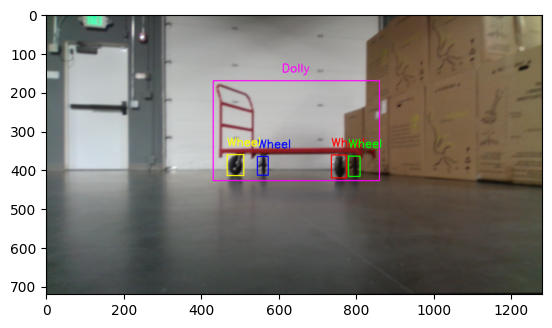

In [31]:
json_path = r'/content/sample_dataset/sample_dataset/labels/json/training_images_take_7_279_aug1_0.json'
with open(json_path, 'rb') as f:
  json_string = json.load(f)

coord = extract_coordinates(json_string)

img = cv2.imread('/content/sample_dataset/sample_dataset/images_aug/training_images_take_7_279_aug1_0.png')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255)]

font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_thickness = 2

# drow rectangles 
for i, bbox in enumerate(coord):
  color = colors[i % len(colors)]
  left, top, right, bottom = bbox['Left'], bbox['Top'], bbox['Right'], bbox['Bottom']
  objectClassName = bbox['ObjectClassName']
  cv2.rectangle(img_rgb, (left, top), (right, bottom), color, thickness=2)
  (text_width, text_height), _ = cv2.getTextSize(objectClassName, font, font_scale, font_thickness)
  text_left = max(left, left + (right - left) // 2 - text_width // 2)
  cv2.putText(img_rgb, objectClassName, (text_left, top - text_height), font, font_scale, color, font_thickness)

plt.imshow(img_rgb)
plt.show()

## Train Test Split

In [32]:
dataset_dir = r'/content/sample_dataset/sample_dataset/images_aug'
label_dir = r'/content/sample_dataset/sample_dataset/labels/json'

image_filenames = os.listdir(dataset_dir)
label_filenames = []

for image in image_filenames:
  label_filenames.append(os.path.basename(get_label_path(os.path.join(dataset_dir, image))))

# print(image_filenames)
# print(label_filenames)

train_image, test_image, train_label, test_label = train_test_split(image_filenames, label_filenames, test_size=0.2, random_state=42)



In [33]:
print(f'Training images: {len(train_image)}')
print(f'Training Labels: {len(train_label)}')
print(f'Test images: {len(test_image)}')
print(f'Test Labels: {len(test_label)}')

Training images: 320
Training Labels: 320
Test images: 80
Test Labels: 80


In [34]:
print(f'"train_image[0]" = {train_image[0]}, "train_label[0]" = {train_label[0]}')

"train_image[0]" = training_images_take_7_360.png, "train_label[0]" = training_images_take_7_360.json


# Training on YOLOv5

##### we need to convert our labels to .txt files instead of json

In [35]:
def normalize_labels(json_path, new_folder_path):
  with open(json_path, 'rb') as f:
    annotations = json.load(f)

  # annotations = json.loads(json_string)

  # all the images are 1280 x 720 
  image_width = 1280
  image_height = 720

  output_lines = []

  for annotation in annotations:
    class_id = annotation["ObjectClassId"]
    left = annotation["Left"]
    top = annotation["Top"]
    right = annotation["Right"]
    bottom = annotation["Bottom"]

    # normalizing the labels data (between 0 and 1)
    x_center = (left + right) / (2 * image_width) 
    y_center = (top + bottom) / (2 * image_height)
    width = (right - left) / image_width
    height = (bottom - top) / image_height

    output_line = f"{class_id} {x_center} {y_center} {width:} {height:}"
    output_lines.append(output_line)

  json_basename = f"{os.path.splitext(os.path.basename(json_path))[0]}.txt"
  
  

  output_filename =  os.path.join(new_folder_path, json_basename)
  with open(output_filename, "w") as output_file:
    output_file.write("\n".join(output_lines))


In [36]:
new_folder_path = r'/content/sample_dataset/sample_dataset/labels/txt'

if not os.path.exists(new_folder_path):
  os.makedirs(new_folder_path)

normalize_labels('/content/sample_dataset/sample_dataset/labels/json/training_images_take_7_282.json', new_folder_path)

### this will generate all the txt files to use it in YOLOv5

In [37]:
new_folder_path = r'/content/sample_dataset/sample_dataset/labels/txt'

if not os.path.exists(new_folder_path):
  os.makedirs(new_folder_path)


label_dir = r'/content/sample_dataset/sample_dataset/labels/json'

labels_path = os.listdir(label_dir)
i=0
for label in labels_path:
  i+=1
  if i%20 == 0:
    print(i,end=" ") # check the process
  label_path = os.path.join('/content/sample_dataset/sample_dataset/labels/json', label)
  if os.path.isfile(label_path):
    normalize_labels(label_path, new_folder_path)

20 40 60 80 100 120 140 160 180 200 220 240 260 280 300 320 340 360 380 400 

In [38]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.9/78.2 GB disk)


## 1. Detect

In [39]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images

detect: weights=['yolov5s.pt'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

100% 14.1M/14.1M [00:00<00:00, 210MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 47.3ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 76.3ms
Speed: 1.2ms pre-process, 61.8ms inference, 134.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/de

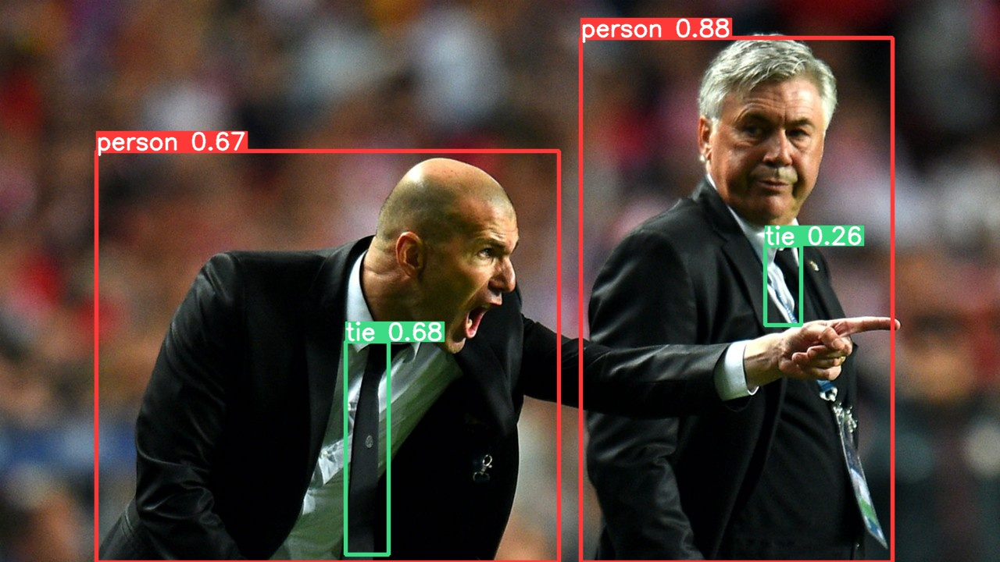

In [40]:
display.Image(filename='runs/detect/exp/zidane.jpg', width=600)

#### after setting yolov5 we need to copy our dataset into /data/ in yolo repository
#### after we need to cread .yaml file to configure our data 

In [41]:
# creating dataset file for YOLO splited into train&val
new_folder_path = r'/content/yolov5/data/'

directories = ['BMW_dataset/images/train', 'BMW_dataset/images/val', 'BMW_dataset/labels/train', 'BMW_dataset/labels/val']


for directory in directories:
  new_dir_path = os.path.join(new_folder_path, directory)
  if not os.path.exists(new_dir_path):
    os.makedirs(new_dir_path)

In [42]:
# splitting dataset but now for txt not json

dataset_dir = r'/content/sample_dataset/sample_dataset/images_aug'
label_dir = r'/content/sample_dataset/sample_dataset/labels/txt'

image_filenames = os.listdir(dataset_dir)
label_filenames = []

for image in image_filenames:
  label_filenames.append(os.path.basename(get_label_path(os.path.join(dataset_dir, image), 'txt')))

# print(image_filenames)
# print(label_filenames)

train_image, val_image, train_label, val_label = train_test_split(image_filenames, label_filenames, test_size=0.2, random_state=42)



In [43]:
# now we need to add splited data in train and val

# train_image, val_image, train_label, val_label

src_dir = '/content/sample_dataset/sample_dataset/images_aug'
dest_dir = '/content/yolov5/data/BMW_dataset/images/train'

# copy images for train_image using shutil:
for filename in os.listdir(src_dir):
  if filename in train_image:
    # Create the full path for the source and destination files
    src_path = os.path.join(src_dir, filename)
    dest_path = os.path.join(dest_dir, filename)
    # Copy the file to the destination directory
    shutil.copy(src_path, dest_path)

#same for validation:
dest_dir = '/content/yolov5/data/BMW_dataset/images/val'

# copy images for test_image using shutil:
for filename in os.listdir(src_dir):
  if filename in val_image:
    # Create the full path for the source and destination files
    src_path = os.path.join(src_dir, filename)
    dest_path = os.path.join(dest_dir, filename)
    # Copy the file to the destination directory
    shutil.copy(src_path, dest_path)

In [44]:
print(f"train data len : {len(os.listdir('/content/yolov5/data/BMW_dataset/images/train'))}")
print(f"val data len : {len(os.listdir('/content/yolov5/data/BMW_dataset/images/val'))}")

train data len : 320
val data len : 80


In [45]:
# we do the same for labels data
# train_image, val_image, train_label, val_label


src_dir = '/content/sample_dataset/sample_dataset/labels/txt'
dest_dir = '/content/yolov5/data/BMW_dataset/labels/train'

# copy images for train_image using shutil:
for filename in os.listdir(src_dir):
  if filename in train_label:
    # Create the full path for the source and destination files
    src_path = os.path.join(src_dir, filename)
    dest_path = os.path.join(dest_dir, filename)
    # Copy the file to the destination directory
    shutil.copy(src_path, dest_path)

#same for validation:
dest_dir = '/content/yolov5/data/BMW_dataset/labels/val'

# copy images for train_image using shutil:
for filename in os.listdir(src_dir):
  if filename in val_label:
    # Create the full path for the source and destination files
    src_path = os.path.join(src_dir, filename)
    dest_path = os.path.join(dest_dir, filename)
    # Copy the file to the destination directory
    shutil.copy(src_path, dest_path)

In [46]:
print(f"train labels len : {len(os.listdir('/content/yolov5/data/BMW_dataset/labels/train'))}")
print(f"val labels len : {len(os.listdir('/content/yolov5/data/BMW_dataset/labels/val'))}")

train labels len : 320
val labels len : 80


In [47]:
# create new yaml file for configuration

new_file_path = r'/content/yolov5/data/BMW_dataset.yaml'

if not os.path.exists(new_file_path):

  with open(new_file_path, 'w') as f:
    f.write('# This is BMW dataset configuration File\n')
    f.write('train: data/BMW_dataset/images/train\n')
    f.write('val: data/BMW_dataset/images/val\n')
    f.write('nc: 2\n') 
    f.write("names: ['Dolly', 'Wheel']\n")

In [48]:
!python train.py --img 640 --batch 8 --epochs 16 --data BMW_dataset.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=BMW_dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=16, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0

In [49]:
!cp /content/yolov5/data/BMW_dataset/images/val/training_images_take_7_280.png /content/yolov5/data/images

In [50]:
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.7 --source data/images

detect: weights=['runs/train/exp/weights/best.pt'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.7, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/3 /content/yolov5/data/images/bus.jpg: 640x480 1 Wheel, 43.9ms
image 2/3 /content/yolov5/data/images/training_images_take_7_280.png: 384x640 1 Dolly, 4 Wheels, 44.6ms
image 3/3 /content/yolov5/data/images/zidane.jpg: 384x640 (no detections), 7.8ms
Speed: 0.5ms pre-process, 32.1ms in

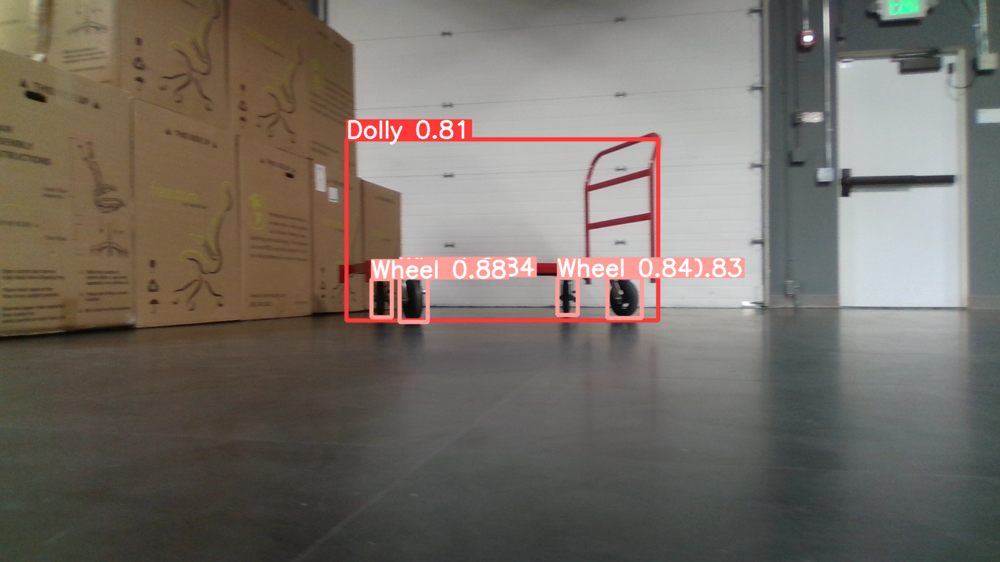

In [51]:
display.Image(filename='runs/detect/exp2/training_images_take_7_280.png', width=600)


### Evaluate the current Model: (val.py)

In [52]:
!python val.py --data BMW_dataset.yaml --weights runs/train/exp/weights/best.pt --img 640

val: data=/content/yolov5/data/BMW_dataset.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/data/BMW_dataset/labels/val.cache... 80 images, 0 backgrounds, 1 corrupt: 100% 80/80 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/yolov5/data/BMW_dataset/images/val/training_images_take_7_380_aug1_0.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0139]
                 Class     Images  Instances          P     

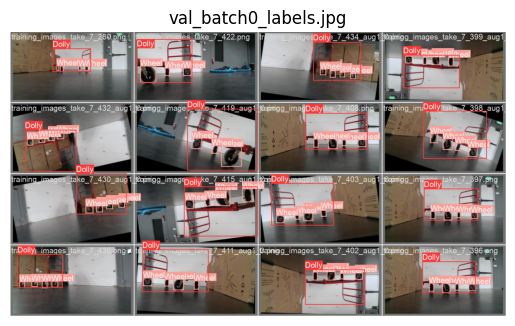

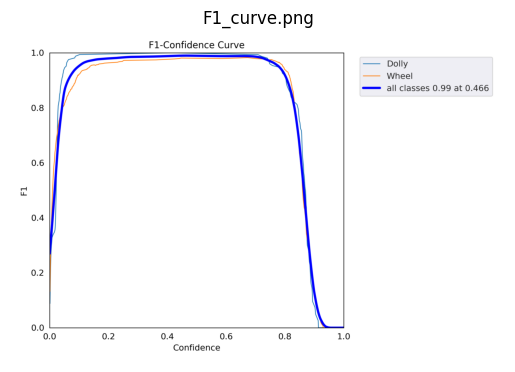

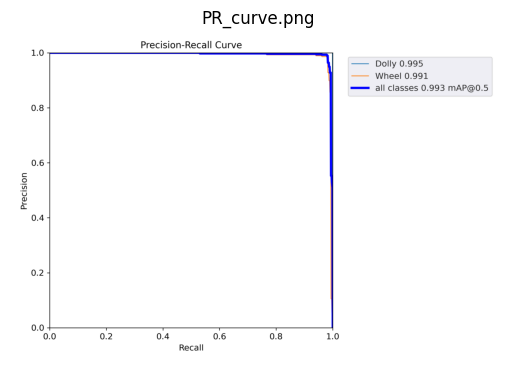

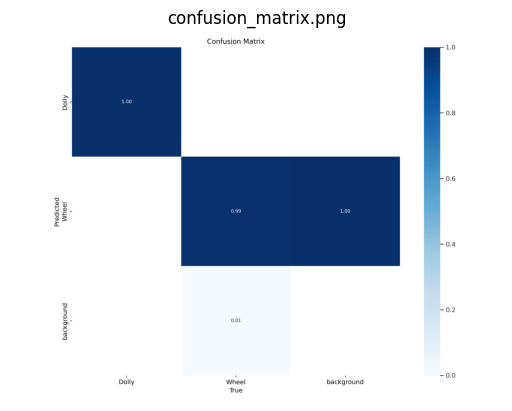

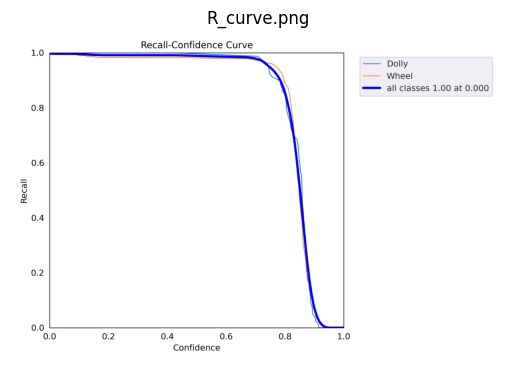

...

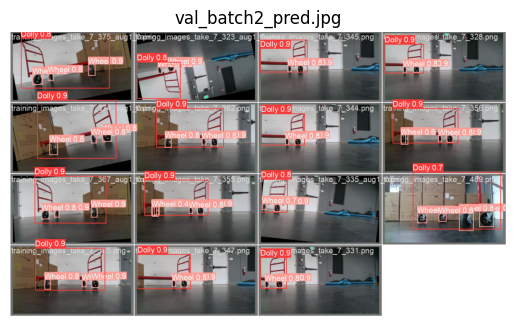

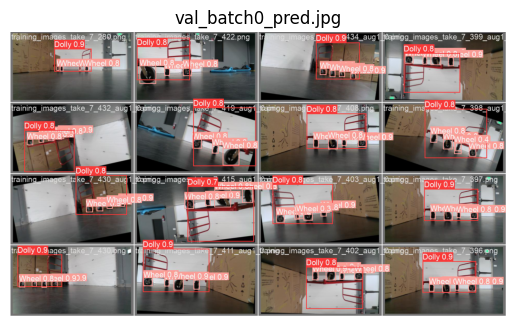

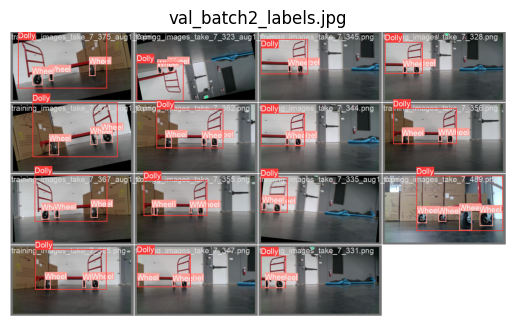

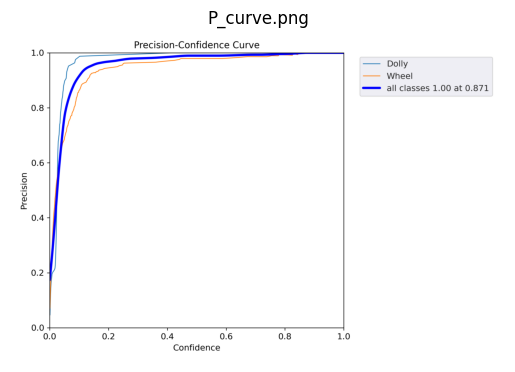

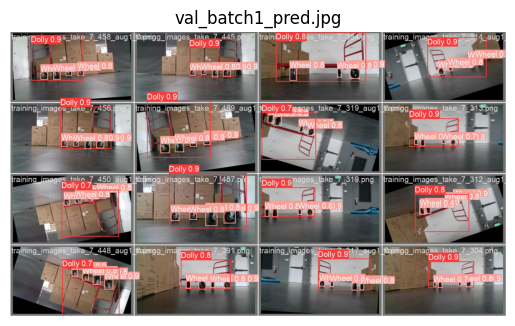

In [53]:

val_exp2_path = "/content/yolov5/runs/val/exp"
images = [img for img in os.listdir(val_exp2_path) if img.endswith(".jpg") or img.endswith(".png")]

for image_name in images:
    image_path = os.path.join(val_exp2_path, image_name)
    img = mpimg.imread(image_path)
    plt.figure()
    plt.title(image_name)
    plt.imshow(img)
    plt.axis("off")
    plt.show()


## relaunch the	training	with	different	hyperparameters	

In [54]:
# we can create a YAML file containing the hyperparameters in data/hyps
# the problem here is that we need to configure all that parameters 
# create new yaml file for hyps

# GO TO /content/yolov5/data/hyps/hyp.BMW_hyps1.yaml and paste the file from https://github.com/ultralytics/yolov5/discussions/7319


'''
 lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3) 
 lrf: 0.01  # final OneCycleLR learning rate (lr0 * lrf) 
 momentum: 0.937  # SGD momentum/Adam beta1 
 weight_decay: 0.0005  # optimizer weight decay 5e-4 
 warmup_epochs: 3.0  # warmup epochs (fractions ok) 
 warmup_momentum: 0.8  # warmup initial momentum 
 warmup_bias_lr: 0.1  # warmup initial bias lr 
 box: 0.05  # box loss gain 
 cls: 0.5  # cls loss gain 
 cls_pw: 1.0  # cls BCELoss positive_weight 
 obj: 1.0  # obj loss gain (scale with pixels) 
 obj_pw: 1.0  # obj BCELoss positive_weight 
 iou_t: 0.20  # IoU training threshold 
 anchor_t: 4.0  # anchor-multiple threshold 
 # anchors: 3  # anchors per output layer (0 to ignore) 
 fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5) 
 hsv_h: 0.015  # image HSV-Hue augmentation (fraction) 
 hsv_s: 0.7  # image HSV-Saturation augmentation (fraction) 
 hsv_v: 0.4  # image HSV-Value augmentation (fraction) 
 degrees: 0.0  # image rotation (+/- deg) 
 translate: 0.1  # image translation (+/- fraction) 
 scale: 0.5  # image scale (+/- gain) 
 shear: 0.0  # image shear (+/- deg) 
 perspective: 0.0  # image perspective (+/- fraction), range 0-0.001 
 flipud: 0.0  # image flip up-down (probability) 
 fliplr: 0.5  # image flip left-right (probability) 
 mosaic: 1.0  # image mosaic (probability) 
 mixup: 0.0  # image mixup (probability) 
 copy_paste: 0.0  # segment copy-paste (probability) 
 '''

bmw_hyps = r'/content/yolov5/data/hyps/hyp.BMW_hyps1.yaml'

with open(bmw_hyps, 'w') as f:
  f.write("# There is alot of hyperparameteres to modify, check https://github.com/ultralytics/yolov5/discussions/7319 \n")


# i will not use hyperparameters for this training

In [55]:
!python train.py --img 640 --batch 16 --epochs 42 --data BMW_dataset.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=BMW_dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=42, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=

In [56]:
!python val.py --data BMW_dataset.yaml --weights runs/train/exp2/weights/best.pt --img 640

val: data=/content/yolov5/data/BMW_dataset.yaml, weights=['runs/train/exp2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/data/BMW_dataset/labels/val.cache... 80 images, 0 backgrounds, 1 corrupt: 100% 80/80 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/yolov5/data/BMW_dataset/images/val/training_images_take_7_380_aug1_0.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0139]
                 Class     Images  Instances          P    

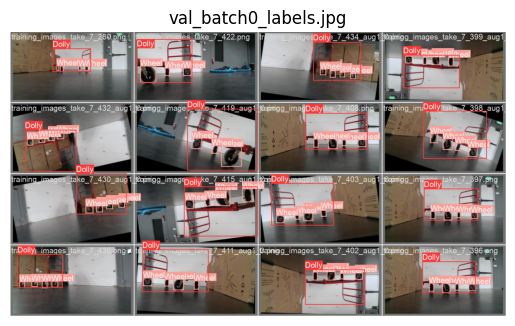

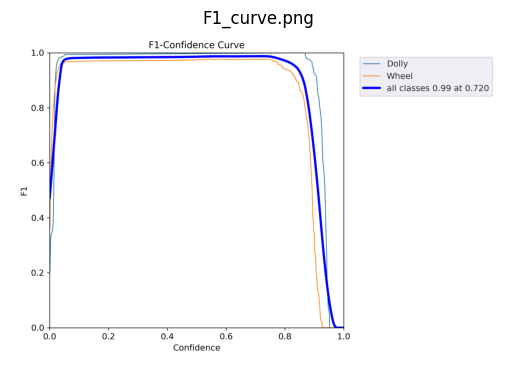

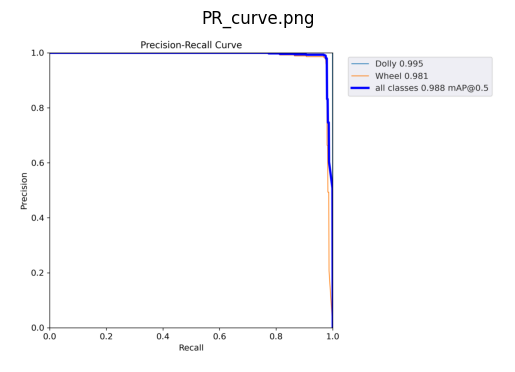

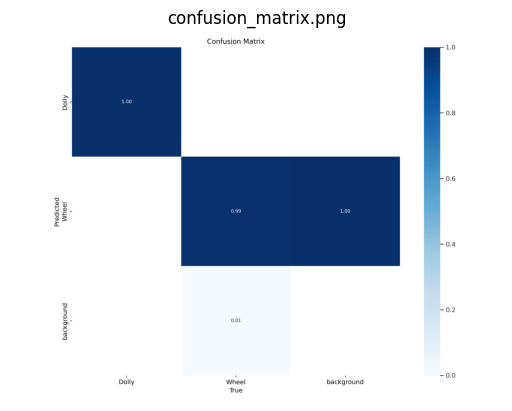

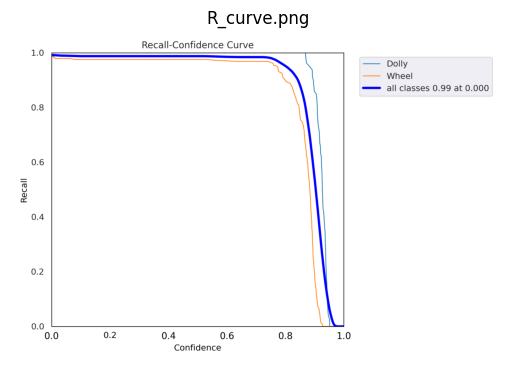

...

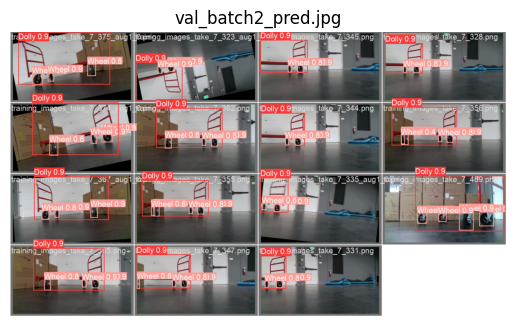

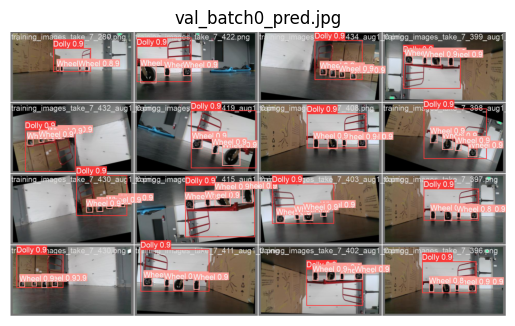

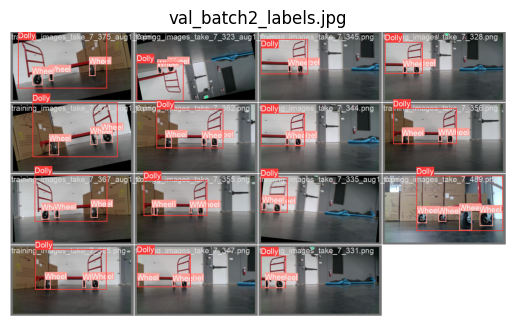

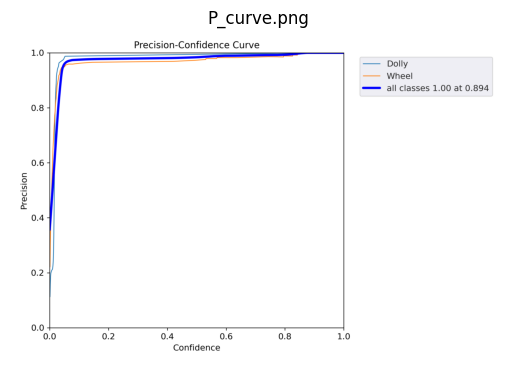

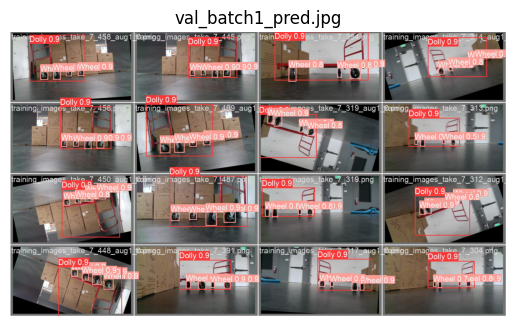

In [57]:
val_exp2_path = "/content/yolov5/runs/val/exp2"
images = [img for img in os.listdir(val_exp2_path) if img.endswith(".jpg") or img.endswith(".png")]

for image_name in images:
    image_path = os.path.join(val_exp2_path, image_name)
    img = mpimg.imread(image_path)
    plt.figure()
    plt.title(image_name)
    plt.imshow(img)
    plt.axis("off")
    plt.show()

In [58]:
!python detect.py --weights runs/train/exp2/weights/best.pt --conf 0.65 --source data/images --save-txt

detect: weights=['runs/train/exp2/weights/best.pt'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.65, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/3 /content/yolov5/data/images/bus.jpg: 640x480 (no detections), 42.4ms
image 2/3 /content/yolov5/data/images/training_images_take_7_280.png: 384x640 1 Dolly, 4 Wheels, 47.7ms
image 3/3 /content/yolov5/data/images/zidane.jpg: 384x640 (no detections), 7.9ms
Speed: 0.5ms pre-process, 

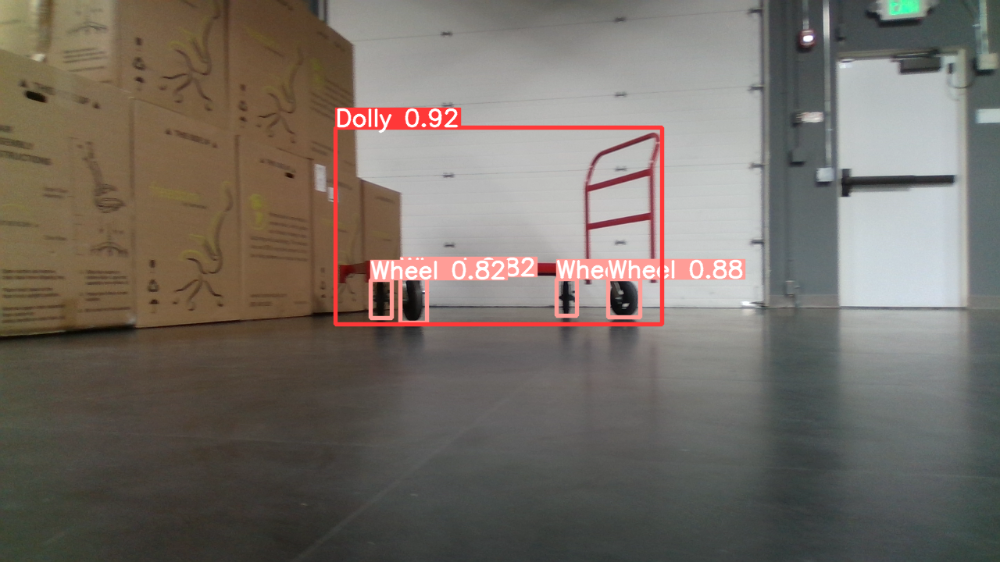

In [59]:
display.Image(filename='runs/detect/exp3/training_images_take_7_280.png', width=600)


In [60]:
!python export.py --weights runs/train/exp2/weights/best.pt --img 640 --batch 1 --opset 12 --dynamic --simplify --include onnx

os.rename('runs/train/exp2/weights/best.onnx', 'runs/train/exp2/weights/yolov5.onnx')


export: data=data/coco128.yaml, weights=['runs/train/exp2/weights/best.pt'], imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=True, simplify=True, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp2/weights/best.pt with output shape (1, 25200, 7) (13.7 MB)
requirements: YOLOv5 requirement "onnx>=1.12.0" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 72.3 MB/s eta 0:00:00

requirements: 1 package updated per ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to

## Trying MobileNet with **tensorflow**

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNet

# load imagenet from tensorflow
mobilenet = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in mobilenet.layers:
    layer.trainable = False

x = mobilenet.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
predictions = tf.keras.layers.Dense(1, activation='sigmoid')(x) # since we are working with only two classes

model = tf.keras.models.Model(inputs=mobilenet.input, outputs=predictions)

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# model.summary()


17225924/17225924 [==============================] - 2s 0us/step


In [ ]:
from sklearn.preprocessing import LabelBinarizer


images_dir = '/content/sample_dataset/sample_dataset/images'
labels_dir = '/content/sample_dataset/sample_dataset/labels/txt'

def load_data(images_dir, labels_dir):
    images = []
    labels = []

    # Read image file names and sort them
    image_files = sorted(os.listdir(images_dir))
    label_files = sorted(os.listdir(labels_dir))

    # Read labels from files and store them in a list
    for label_file in label_files:
        with open(os.path.join(labels_dir, label_file), 'r') as f:
            label_data = f.readline().strip().split()
            labels.append(int(label_data[0]))  # Assuming the class label is an integer

    # Read, resize and store images in a list
    for image_file in image_files:
        image = cv2.imread(os.path.join(images_dir, image_file))
        image = cv2.resize(image, (224, 224))
        images.append(image)

    # Convert lists to numpy arrays
    images = np.array(images)
    labels = np.array(labels)

    # One-hot encode the labels
    lb = LabelBinarizer()
    labels = lb.fit_transform(labels)

    return images, labels


X, y = load_data(images_dir, labels_dir)
hist1 = model.fit(X, y, batch_size=32, epochs=10, validation_split=0.2)


Epoch 1/10
5/5 [==============================] - 13s 385ms/step - loss: 1.1255 - accuracy: 0.6875 - val_loss: 0.7816 - val_accuracy: 0.7500
Epoch 2/10
5/5 [==============================] - 0s 61ms/step - loss: 0.5258 - accuracy: 0.8375 - val_loss: 0.7779 - val_accuracy: 0.7500
Epoch 3/10
5/5 [==============================] - 0s 60ms/step - loss: 0.4340 - accuracy: 0.8500 - val_loss: 0.6347 - val_accuracy: 0.7500
Epoch 4/10
5/5 [==============================] - 0s 52ms/step - loss: 0.4212 - accuracy: 0.8500 - val_loss: 0.7191 - val_accuracy: 0.7500
Epoch 5/10
5/5 [==============================] - 0s 59ms/step - loss: 0.4083 - accuracy: 0.8500 - val_loss: 0.7440 - val_accuracy: 0.7500
Epoch 6/10
5/5 [==============================] - 0s 61ms/step - loss: 0.3732 - accuracy: 0.8500 - val_loss: 0.6960 - val_accuracy: 0.7500
Epoch 7/10
5/5 [==============================] - 0s 58ms/step - loss: 0.3664 - accuracy: 0.8500 - val_loss: 0.8361 - val_accuracy: 0.7500
Epoch 8/10
5/5 [=========

# Fine-tuning Faster-RCNN using pytorch

### Installs and Imports

In [5]:
# Download TorchVision repo to use some files from
# references/detection
!pip install pycocotools --quiet
!git clone https://github.com/pytorch/vision.git
!git checkout v0.3.0

!cp vision/references/detection/utils.py ./
!cp vision/references/detection/transforms.py ./
!cp vision/references/detection/coco_eval.py ./
!cp vision/references/detection/engine.py ./
!cp vision/references/detection/coco_utils.py ./

Cloning into 'vision'...
remote: Enumerating objects: 322058, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 322058 (delta 13), reused 29 (delta 9), pack-reused 322015
Receiving objects: 100% (322058/322058), 651.90 MiB | 38.53 MiB/s, done.
Resolving deltas: 100% (296066/296066), done.
fatal: not a git repository (or any of the parent directories): .git


In [6]:
# these are the helper libraries imported.
from engine import train_one_epoch, evaluate
import utils
import transforms as T

In [7]:
ws = '/content/fasterRCNN'
if not os.path.exists(ws):
    os.makedirs(ws)

train_dir = '/content/fasterRCNN/dataset/train'
test_dir = '/content/fasterRCNN/dataset/test'

if not os.path.exists(train_dir):
    os.makedirs(train_dir)

if not os.path.exists(test_dir):
    os.makedirs(test_dir)

In [8]:
def create_train_test_dirs(source_dir, train_dir, test_dir, test_ratio=0.2):
    # Load data
    files = [f for f in os.listdir(source_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    # Split the data into train and test sets
    train_files, test_files = train_test_split(files, test_size=test_ratio, random_state=42)


    if not os.path.exists(train_dir):
        os.makedirs(train_dir)

    if not os.path.exists(test_dir):
        os.makedirs(test_dir)

    # Move images to respective directories
    for file in train_files:
        shutil.copy(os.path.join(source_dir, file), os.path.join(train_dir, file))
    
    for file in test_files:
        shutil.copy(os.path.join(source_dir, file), os.path.join(test_dir, file))

In [9]:
files_dir = '/content/fasterRCNN/dataset/train'
test_dir = '/content/fasterRCNN/dataset/test'

source_dir = '/content/sample_dataset/sample_dataset/images'

create_train_test_dirs(source_dir, files_dir, test_dir)

In [10]:
# adding xml files(labels) to the datasets

# Set the source and destination directories
test_dir = "/content/fasterRCNN/dataset/test/"
train_dir = "/content/fasterRCNN/dataset/train/"
xml_source= "/content/sample_dataset/sample_dataset/labels/pascal/"
def add_xml(source_dir, xml_source_dir):
  # Loop through all the files in the source directory
  for file in os.listdir(source_dir):
    # Check if the file is a PNG image
    if file.endswith(".png"):
      # Replace the file extension from .png to .xml
      xml_file = file.replace(".png", ".xml")
      
      # Define the full source and destination paths for the XML files
      src_path = os.path.join(xml_source_dir, xml_file)
      dst_path = os.path.join(source_dir, xml_file)
      
      # Check if the XML file exists in the source directory
      if os.path.isfile(src_path):
        # Copy the XML file to the target directory
        shutil.copy(src_path, dst_path)
      else:
        os.remove(os.path.join(source_dir, file))
        print(f"XML file {src_path} not found")
        print(f"PNG file {os.path.join(source_dir, file)} has been deleted.")

add_xml(test_dir, xml_source)
add_xml(train_dir, xml_source)

XML file /content/sample_dataset/sample_dataset/labels/pascal/training_images_take_7_279.xml not found
PNG file /content/fasterRCNN/dataset/train/training_images_take_7_279.png has been deleted.


In [11]:
# # copying images and labels to the dir
# source_dir = '/content/sample_dataset/sample_dataset/images'
# dest_dir = '/content/sample_dataset/sample_dataset/images_and_labels'

# if not os.path.exists(dest_dir):
#     os.makedirs(dest_dir)

# for filename in os.listdir(source_dir):
#     if filename.endswith('.png'):
#         shutil.copy(os.path.join(source_dir, filename), dest_dir)

In [12]:
# source_dir = '/content/sample_dataset/sample_dataset/labels/pascal'
# dest_dir = '/content/sample_dataset/sample_dataset/images_and_labels'

# if not os.path.exists(dest_dir):
#     os.makedirs(dest_dir)

# for filename in os.listdir(source_dir):
#     if filename.endswith('.xml'):
#         shutil.copy(os.path.join(source_dir, filename), dest_dir)

In [13]:
# file_path = '/content/sample_dataset/sample_dataset/images_and_labels/training_images_take_7_279.png'

# if os.path.exists(file_path):
#     os.remove(file_path)
# else:
#     print(f"The file '{file_path}' does not exist.")

In [11]:
class BMWImagesDataset(torch.utils.data.Dataset):

    def __init__(self, files_dir, width, height, transforms=None):
        self.transforms = transforms
        self.files_dir = files_dir
        self.height = height
        self.width = width
        
        # sorting the images for consistency
        # To get images, the extension of the filename is checked to be jpg
        self.imgs = [image for image in sorted(os.listdir(files_dir))
                        if image[-4:]=='.png']
        
        
        # classes: 0 index is reserved for background
        self.classes = [_, 'Wheel','Dolly','orange']

    def __getitem__(self, idx):

        img_name = self.imgs[idx]
        image_path = os.path.join(self.files_dir, img_name)

        # reading the images and converting them to correct size and color    
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)
        # diving by 255
        img_res /= 255.0
        
        # annotation file
        annot_filename = img_name[:-4] + '.xml'
        annot_file_path = os.path.join(self.files_dir, annot_filename)
        
        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()
        
        # cv2 image gives size as height x width
        wt = img.shape[1]
        ht = img.shape[0]
        
        # box coordinates for xml files are extracted and corrected for image size given
        for member in root.findall('object'):
            labels.append(self.classes.index(member.find('name').text))
            
            # bounding box
            xmin = int(member.find('bndbox').find('xmin').text)
            xmax = int(member.find('bndbox').find('xmax').text)
            
            ymin = int(member.find('bndbox').find('ymin').text)
            ymax = int(member.find('bndbox').find('ymax').text)
            
            
            xmin_corr = (xmin/wt)*self.width
            xmax_corr = (xmax/wt)*self.width
            ymin_corr = (ymin/ht)*self.height
            ymax_corr = (ymax/ht)*self.height
            
            boxes.append([xmin_corr, ymin_corr, xmax_corr, ymax_corr])
        
        # convert boxes into a torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        
        # getting the areas of the boxes
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        # suppose all instances are not crowd
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        
        labels = torch.as_tensor(labels, dtype=torch.int64)


        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        # image_id
        image_id = torch.tensor([idx])
        target["image_id"] = image_id


        if self.transforms:
            
            sample = self.transforms(image = img_res,
                                     bboxes = target['boxes'],
                                     labels = labels)
            
            img_res = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])
            
            
            
        return img_res, target

    def __len__(self):
        return len(self.imgs)


# check dataset
dataset = BMWImagesDataset(files_dir, 1280, 720)
print('length of dataset = ', len(dataset), '\n')

# getting the image and target for a test index.  Feel free to change the index.
img, target = dataset[4]
print(img.shape, '\n',target)

length of dataset =  159 

(720, 1280, 3) 
 {'boxes': tensor([[495., 367., 529., 427.],
        [449., 365., 479., 424.],
        [698., 370., 724., 424.],
        [767., 365., 807., 424.],
        [400., 167., 842., 426.]]), 'labels': tensor([1, 1, 1, 1, 2]), 'area': tensor([  2040.,   1770.,   1404.,   2360., 114478.]), 'iscrowd': tensor([0, 0, 0, 0, 0]), 'image_id': tensor([4])}


## Visualization

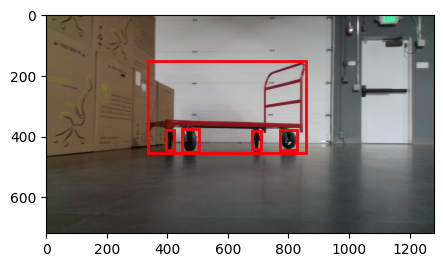

In [12]:
# Function to visualize bounding boxes in the image

def plot_img_bbox(img, target):
    # plot the image and bboxes
    # Bounding boxes are defined as follows: x-min y-min width height
    fig, a = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    a.imshow(img)
    for box in (target['boxes']):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        # Draw the bounding box on top of the image
        a.add_patch(rect)
    plt.show()
    
# plotting the image with bboxes. Feel free to change the index
img, target = dataset[25]
plot_img_bbox(img, target)

## Model

In [13]:
def get_object_detection_model(num_classes):

    # load a model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) 

    return model

## Augmentation

In [14]:
# Send train=True fro training transforms and False for val/test transforms
def get_transform(train):
    
    if train:
        return A.Compose([
                            A.HorizontalFlip(0.5),
                     # ToTensorV2 converts image to pytorch tensor without div by 255
                            ToTensorV2(p=1.0) 
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

## Preparing dataset

In [15]:
# use our dataset and defined transformations
dataset = BMWImagesDataset(files_dir, 1280, 720, transforms= get_transform(train=True))
dataset_test = BMWImagesDataset(files_dir, 1280, 720, transforms= get_transform(train=False))

# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()

# train test split
test_split = 0.2
tsize = int(len(dataset)*test_split)
dataset = torch.utils.data.Subset(dataset, indices[:-tsize])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-tsize:])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=10, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=10, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

## Training

In [16]:
# to train on gpu if selected.
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')


num_classes = 4

# get the model using our helper function
model = get_object_detection_model(num_classes)

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 96.4MB/s]


In [17]:
# begin the training

# training for 10 epochs
num_epochs = 10

for epoch in range(num_epochs):
    # training for one epoch
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/13]  eta: 0:03:13  lr: 0.000421  loss: 2.0937 (2.0937)  loss_classifier: 1.5207 (1.5207)  loss_box_reg: 0.3676 (0.3676)  loss_objectness: 0.1855 (0.1855)  loss_rpn_box_reg: 0.0199 (0.0199)  time: 14.9079  data: 2.0998  max mem: 12572
Epoch: [0]  [10/13]  eta: 0:00:11  lr: 0.004584  loss: 1.3894 (1.5339)  loss_classifier: 0.6157 (0.8368)  loss_box_reg: 0.6732 (0.5997)  loss_objectness: 0.0268 (0.0808)  loss_rpn_box_reg: 0.0179 (0.0166)  time: 3.8741  data: 0.2324  max mem: 12905
Epoch: [0]  [12/13]  eta: 0:00:03  lr: 0.005000  loss: 1.3128 (1.4340)  loss_classifier: 0.5770 (0.7502)  loss_box_reg: 0.6236 (0.5914)  loss_objectness: 0.0461 (0.0756)  loss_rpn_box_reg: 0.0179 (0.0168)  time: 3.6542  data: 0.2027  max mem: 12906
Epoch: [0] Total time: 0:00:47 (3.6599 s / it)
creating index...
index created!
Test:  [0/4]  eta: 0:00:10  model_time: 1.1750 (1.1750)  evaluator_time: 0.0934 (0.0934)  time: 2.6103  data: 1.3126  max mem: 12906
Test:  [3/4]  eta: 0:00:01  model_time:

In [19]:
!pip install onnx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 70.9 MB/s eta 0:00:00


In [20]:
import torch.onnx

# Provide input tensor dimensions (C, H, W) for the ONNX export
dummy_input = torch.randn(1, 3, 224, 224).to(device)

# Define the path for the output ONNX file
onnx_file_path = "/content/fasterRCNN/faster-rcnn.onnx"

# Export the model to ONNX format
torch.onnx.export(model, dummy_input, onnx_file_path, input_names=['input'], output_names=['output'], opset_version=11)

print(f"The model has been exported to {onnx_file_path}")

============= Diagnostic Run torch.onnx.export version 2.0.0+cu118 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

The model has been exported to /content/fasterRCNN/faster-rcnn.onnx


## Testing

In [25]:
# the function takes the original prediction and the iou threshold.

def apply_nms(orig_prediction, iou_thresh=0.3):
    
    # torchvision returns the indices of the bboxes to keep
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

# function to convert a torchtensor back to PIL image
def torch_to_pil(img):
    img = img.cpu() # move to cpu
    return torchtrans.ToPILImage()(img).convert('RGB')

In [ ]:
# pick one image from the test set
img, target = dataset_test[5]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]
    
print('predicted #boxes: ', len(prediction['labels']))
print('real #boxes: ', len(target['labels']))

In [ ]:
nms_prediction = apply_nms(prediction, iou_thresh=0.2)
print('NMS APPLIED MODEL OUTPUT')
plot_img_bbox(torch_to_pil(img), nms_prediction)

In [ ]:
test_dataset = FruitImagesDataset(test_dir, 480, 480, transforms= get_transform(train=True))
# pick one image from the test set
img, target = test_dataset[10]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]
    
print('EXPECTED OUTPUT\n')
plot_img_bbox(torch_to_pil(img), target)
print('MODEL OUTPUT\n')
nms_prediction = apply_nms(prediction, iou_thresh=0.01)

plot_img_bbox(torch_to_pil(img), nms_prediction)